In [135]:
# import json
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import simplejson
# import scipy
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm
from sklearn.ensemble import AdaBoostClassifier, BaggingRegressor, RandomForestRegressor
from sklearn.metrics import r2_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.tree import DecisionTreeRegressor

In [2]:
edu_spending_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=0"
arts_edu_policies_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=1397950742"
sp_g4_math_2019_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=1999542441"
sp_g8_math_2019_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=456758856"
sp_g4_reading_2019_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=1273736783"
sp_g8_reading_2019_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=960745170"

arts_edu_policies_2021_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=496847001"
happiness_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=937005672"

In [3]:
# use first column of state names to index data instead of arbitrary 0..50 numbers
edu_spending_data = pd.read_csv(edu_spending_datapath, index_col=0)
arts_edu_policies_data = pd.read_csv(arts_edu_policies_datapath, index_col=0)
sp_g4_math_2019_data = pd.read_csv(sp_g4_math_2019_datapath, index_col=0)
sp_g4_reading_2019_data = pd.read_csv(sp_g4_reading_2019_datapath, index_col=0)
sp_g8_math_2019_data = pd.read_csv(sp_g8_math_2019_datapath, index_col=0)
sp_g8_reading_2019_data = pd.read_csv(sp_g8_reading_2019_datapath, index_col=0)

arts_edu_policies_2021_data = pd.read_csv(arts_edu_policies_2021_datapath, index_col=0)
happiness_data = pd.read_csv(happiness_datapath, index_col=0)

# add prefixes to differentiate score columns
sp_g4_math_2019_data = sp_g4_math_2019_data.add_prefix("g4_math_2019 - ")
sp_g4_reading_2019_data = sp_g4_reading_2019_data.add_prefix("g4_reading_2019 - ")
sp_g8_math_2019_data = sp_g8_math_2019_data.add_prefix("g8_math_2019 - ")
sp_g8_reading_2019_data = sp_g8_reading_2019_data.add_prefix("g8_reading_2019 - ")

In [79]:
data = pd.concat(
    [
        edu_spending_data,
        arts_edu_policies_data,
        sp_g4_math_2019_data,
        sp_g4_reading_2019_data,
        sp_g8_math_2019_data,
        sp_g8_reading_2019_data,
        arts_edu_policies_2021_data,
        happiness_data
    ],
    axis=1)

data = data[data.columns.drop(list(data.filter(regex='SigSymbol')))] # drop all columns containing SigSymbol

data = data.dropna() # drop all null rows (National average, Puerto Rico, etc.)

# convert currency values to integers
data['Spending Per Pupil'] = data['Spending Per Pupil'].str.replace('[$,]', '', regex=True).astype('int')
data['Funding Per Pupil'] = data['Funding Per Pupil'].str.replace('[$,]', '', regex=True).astype('int')
data['Differential'] = data['Differential'].str.replace('[$,]', '', regex=True).astype('int')

# convert T/F to boolean number 0/1
data = data.applymap(lambda x: 1 if x==True else (0 if x==False else x))

# replace Yes and No with 1 and 0
data = data.replace(to_replace = ['Yes','No'],value = [1, 0])

# replace '#' sign (signifies a 0 change from national average from source dataset) into a 0 integer
data = data.replace(to_replace = '#',value = 0)

for col in data.columns: # convert all data from strings to integers
    data[col] = pd.to_numeric(data[col])

# data

In [80]:
# TOT_ENR_M and TOT_ENR_F are in single values. Nothing more. So 1257 is 1,257 students.

# 'Civil Rights Data Collection State Files' directory needed. Can be accessed at: https://drive.google.com/drive/folders/1cDKJmq6HJexhUwTHP7oGLkKO4-89hjFV?usp=sharing
civil_rights_dir_datapath = r'./Civil Rights Data Collection State Files'
civil_rights_filenames = glob.glob(civil_rights_dir_datapath + "/*.csv")
civil_rights_data_original = {}

for filename in civil_rights_filenames:
    df = pd.read_csv(filename, index_col=None, header=0, dtype={'SCH_MAGNETDETAIL': "string", 'SCH_ALTFOCUS': "string", 'SCH_APSEL': "string", 'SCH_APMATHENR_IND': "string", 'SCH_APSCIENR_IND': "string", 'SCH_APOTHENR_IND': "string", 'SCH_JJTYPE': 'string', 'SCH_UGDETAIL_ES': 'string', 'SCH_UGDETAIL_MS': 'string', 'SCH_UGDETAIL_HS': 'string', 'LEAID': 'string', 'COMBOKEY': 'string'})
    
    state_name = df['LEA_STATE_NAME'][0].title()
    
    num = df._get_numeric_data()
    num[num < 0] = 0

    civil_rights_data_original[state_name] = df

In [81]:
state_names = ["Alaska", "Alabama", "Arkansas", "Arizona", "California", "Colorado", "Connecticut", "Delaware", "Florida", "Georgia", "Hawaii", "Iowa", "Idaho", "Illinois", "Indiana", "Kansas", "Kentucky", "Louisiana", "Massachusetts", "Maryland", "Maine", "Michigan", "Minnesota", "Missouri", "Mississippi", "Montana", "North Carolina", "North Dakota", "Nebraska", "New Hampshire", "New Jersey", "New Mexico", "Nevada", "New York", "Ohio", "Oklahoma", "Oregon", "Pennsylvania", "Rhode Island", "South Carolina", "South Dakota", "Tennessee", "Texas", "Utah", "Virginia", "Vermont", "Washington", "Wisconsin", "West Virginia", "Wyoming"]

civil_rights_data = pd.DataFrame(index=state_names)

def populate_df_column(col_name_new, col_names):
    civil_rights_data[col_name_new] = np.nan
    for state, df in civil_rights_data_original.items():
        sum = 0
        for col_name in col_names:
            sum += df[col_name].sum()
        
        civil_rights_data[col_name_new][state] = sum

populate_df_column('Total Enrolled', ['TOT_ENR_M', 'TOT_ENR_F'])
populate_df_column('Total Chronic Student Absenteeism', ['TOT_ABSENT_M', 'TOT_ABSENT_F'])
populate_df_column('Students with One or More In-School Suspensions', ['TOT_DISCWODIS_ISS_M', 'TOT_DISCWODIS_ISS_F', 'TOT_DISCWDIS_ISS_IDEA_M', 'TOT_DISCWDIS_ISS_IDEA_F'])
populate_df_column('Instances of Out-of-School Suspension', ['SCH_OOSINSTANCES_WODIS', 'SCH_OOSINSTANCES_IDEA'])
populate_df_column('Days Missed Due to Out-of-School Suspension', ['TOT_DAYSMISSED_M', 'TOT_DAYSMISSED_F'])
populate_df_column('Preschool Students Who Received Expulsions', ['TOT_PSDISC_EXP_M', 'TOT_PSDISC_EXP_F'])
populate_df_column('Students Who Received an Expulsion with Educational Services', ['TOT_DISCWODIS_EXPWE_M', 'TOT_DISCWODIS_EXPWE_F'])
populate_df_column('Students Who Received an Expulsion without Educational Services', ['TOT_DISCWODIS_EXPWOE_M', 'TOT_DISCWODIS_EXPWOE_F'])
populate_df_column('Students Who Received an Expulsion Under Zero Tolerance Policies', ['TOT_DISCWODIS_EXPZT_M', 'TOT_DISCWODIS_EXPZT_F'])
populate_df_column('Students Referred to Law Enforcement Agency or Official', ['TOT_DISCWODIS_REF_M', 'TOT_DISCWODIS_REF_F'])
populate_df_column('Students Who Received a School-Related Arrest', ['TOT_DISCWODIS_ARR_M', 'TOT_DISCWODIS_ARR_F'])
populate_df_column('Students Transferred to Alternative School for Disciplinary Reasons', ['TOT_DISCWODIS_TFRALT_M', 'TOT_DISCWODIS_TFRALT_F'])
populate_df_column('Incidents of Rape or Attempted Rape', ['SCH_OFFENSE_RAPE'])
populate_df_column('Incidents of Sexual Assault (Not Including Rape)', ['SCH_OFFENSE_BATT'])
populate_df_column('Incidents of Robbery with Weapon', ['SCH_OFFENSE_ROBWW'])
populate_df_column('Incidents of Robbery with Firearm or Explosive Device', ['SCH_OFFENSE_ROBWX'])
populate_df_column('Incidents of Robbery without Weapon', ['SCH_OFFENSE_ROBWOW'])
populate_df_column('Incidents of Physical Attack or Fight with Weapon', ['SCH_OFFENSE_ATTWW'])
populate_df_column('Incidents of Physical Attack or Fight with Firearm or Explosive Device', ['SCH_OFFENSE_ATTWX'])
populate_df_column('Incidents of Physical Attack or Fight without Weapon', ['SCH_OFFENSE_ATTWOW'])
populate_df_column('Incidents of Threats of Physical Attack with Weapon', ['SCH_OFFENSE_THRWW'])
populate_df_column('Incidents of Threats of Physical Attack with Firearm or Explosive Device', ['SCH_OFFENSE_THRWX'])
populate_df_column('Incidents of Threats of Physical Attack without Weapon', ['SCH_OFFENSE_THRWOW'])
populate_df_column('Incidents of Possession of Firearm or Explosive Device', ['SCH_OFFENSE_POSSWX'])
populate_df_column('Allegations of Harrassment or Bullying', ['SCH_HBALLEGATIONS_SEX', 'SCH_HBALLEGATIONS_RAC', 'SCH_HBALLEGATIONS_DIS', 'SCH_HBALLEGATIONS_ORI', 'SCH_HBALLEGATIONS_REL'])
populate_df_column('Students Reported as Harrassed or Bullied', ['TOT_HBREPORTED_SEX_M', 'TOT_HBREPORTED_SEX_F', 'TOT_HBREPORTED_RAC_M', 'TOT_HBREPORTED_RAC_F', 'TOT_HBREPORTED_DIS_M', 'TOT_HBREPORTED_DIS_F'])
populate_df_column('Students Disciplined for Harrassment or Bullying', ['TOT_HBDISCIPLINED_SEX_M', 'TOT_HBDISCIPLINED_SEX_F', 'TOT_HBDISCIPLINED_RAC_M', 'TOT_HBDISCIPLINED_RAC_F', 'TOT_HBDISCIPLINED_DIS_M', 'TOT_HBDISCIPLINED_DIS_F'])
populate_df_column('Students Subjected to Seclusion', ['TOT_RS_NONIDEA_SECL_M', 'TOT_RS_NONIDEA_SECL_F']) # doesn't include IDEA students
populate_df_column('Instances of Mechanical Restraint', ['SCH_RSINSTANCES_MECH_WODIS']) # doesn't include IDEA students
populate_df_column('Instances of Physical Restraint', ['SCH_RSINSTANCES_PHYS_WODIS']) # doesn't include IDEA students
populate_df_column('Instances of Seclusion', ['SCH_RSINSTANCES_SECL_WODIS']) # doesn't include IDEA students

del civil_rights_data_original

# civil_rights_data

In [82]:
def create_student_ratio_columns(column_names):
    for name in column_names:
        civil_rights_data['Ratio - ' + name] = civil_rights_data[name] / civil_rights_data['Total Enrolled']

student_ratio_columns = ['Students with One or More In-School Suspensions', 'Students Who Received an Expulsion with Educational Services', 'Students Who Received an Expulsion without Educational Services', 'Students Who Received an Expulsion Under Zero Tolerance Policies', 'Students Who Received an Expulsion Under Zero Tolerance Policies', 'Students Referred to Law Enforcement Agency or Official', 'Students Who Received a School-Related Arrest', 'Students Transferred to Alternative School for Disciplinary Reasons', 'Students Reported as Harrassed or Bullied', 'Students Disciplined for Harrassment or Bullying', 'Students Subjected to Seclusion']

create_student_ratio_columns(student_ratio_columns)

# civil_rights_data

In [83]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
data = pd.concat([data, civil_rights_data], axis=1)
data

,Spending Per Pupil,Funding Per Pupil,Differential,State defines the arts in statute or code as a core or academic subject,State adopted early childhood or prekindergarten arts education standards,State adopted elementary and/or secondary arts education standards,State requires districts or schools to offer arts instruction at the elementary school level,State requires districts or schools to offer arts instruction at the middle school level,State requires districts or schools to offer arts instruction at the high school level,State includes arts courses as an option to fulfill graduation requirements,"State requires state-, district- or school-level assessment of student learning in the arts",State specifies arts education as a requirement for schools to be accredited,State provides funding for an arts education grant program or a state-funded school for the arts,g4_math_2019 - Score (MN),g4_math_2019 - Difference from National Public (NP) (SigDiff),g4_math_2019 - At or Above Basic (AB),g4_math_2019 - At or Above Proficient (AP),g4_reading_2019 - Score (MN),g4_reading_2019 - Difference from National Public (NP) (SigDiff),g4_reading_2019 - At or Above Basic (AB),g4_reading_2019 - At or Above Proficient (AP),g8_math_2019 - Score (MN),g8_math_2019 - Difference from National Public (NP) (SigDiff),g8_math_2019 - At or Above Basic (AB),g8_math_2019 - At or Above Proficient (AP),g8_reading_2019 - Score (MN),g8_reading_2019 - Difference from National Public (NP) (SigDiff),g8_reading_2019 - At or Above Basic (AB),g8_reading_2019 - At or Above Proficient (AP),Arts as a Core Academic Subject,Early Childhood Arts Ed Standards,Elementary & Secondary Arts Ed Standards,Arts Ed Instructional Requirement Elementary School,Arts Ed Instructional Requirement Middle School,Arts Ed Instructional Requirement High School,Arts Requirements for High School Graduation,Arts Alternatives for High School Graduation,Arts Ed Assessment Requirements,Arts Ed Requirements for State Accredidation,Licensure Requirements for Non-Arts Teachers,Licensure Requirements for Arts Teachers,State Arts Ed Grant Program or School for Arts,Arts and STEAM Diploma Seals,Other State Arts Ed Policies,Total Score,‘Emotional & Physical Well-Being’ Rank,‘Work Environment’ Rank,‘Community & Environment’ Rank,Total Enrolled,Total Chronic Student Absenteeism,Students with One or More In-School Suspensions,Instances of Out-of-School Suspension,Days Missed Due to Out-of-School Suspension,Preschool Students Who Received Expulsions,Students Who Received an Expulsion with Educational Services,Students Who Received an Expulsion without Educational Services,Students Who Received an Expulsion Under Zero Tolerance Policies,Students Referred to Law Enforcement Agency or Official,Students Who Received a School-Related Arrest,Students Transferred to Alternative School for Disciplinary Reasons,Incidents of Rape or Attempted Rape,Incidents of Sexual Assault (Not Including Rape),Incidents of Robbery with Weapon,Incidents of Robbery with Firearm or Explosive Device,Incidents of Robbery without Weapon,Incidents of Physical Attack or Fight with Weapon,Incidents of Physical Attack or Fight with Firearm or Explosive Device,Incidents of Physical Attack or Fight without Weapon,Incidents of Threats of Physical Attack with Weapon,Incidents of Threats of Physical Attack with Firearm or Explosive Device,Incidents of Threats of Physical Attack without Weapon,Incidents of Possession of Firearm or Explosive Device,Allegations of Harrassment or Bullying,Students Reported as Harrassed or Bullied,Students Disciplined for Harrassment or Bullying,Students Subjected to Seclusion,Instances of Mechanical Restraint,Instances of Physical Restraint,Instances of Seclusion,Ratio - Students with One or More In-School Suspensions,Ratio - Students Who Received an Expulsion with Educational Services,Ratio - Students Who Received an Expulsion without Educational Services,Ratio - Students Who Received an Expulsion Under Zero Toler

In [40]:
pd.options.display.max_columns = None
corr = data.drop(columns=['State adopted early childhood or prekindergarten arts education standards', 'State adopted elementary and/or secondary arts education standards', 'Early Childhood Arts Ed Standards', 'Elementary & Secondary Arts Ed Standards']).corr()
corr

,Spending Per Pupil,Funding Per Pupil,Differential,State defines the arts in statute or code as a core or academic subject,State requires districts or schools to offer arts instruction at the elementary school level,State requires districts or schools to offer arts instruction at the middle school level,State requires districts or schools to offer arts instruction at the high school level,State includes arts courses as an option to fulfill graduation requirements,"State requires state-, district- or school-level assessment of student learning in the arts",State specifies arts education as a requirement for schools to be accredited,State provides funding for an arts education grant program or a state-funded school for the arts,g4_math_2019 - Score (MN),g4_math_2019 - Difference from National Public (NP) (SigDiff),g4_math_2019 - At or Above Basic (AB),g4_math_2019 - At or Above Proficient (AP),g4_reading_2019 - Score (MN),g4_reading_2019 - Difference from National Public (NP) (SigDiff),g4_reading_2019 - At or Above Basic (AB),g4_reading_2019 - At or Above Proficient (AP),g8_math_2019 - Score (MN),g8_math_2019 - Difference from National Public (NP) (SigDiff),g8_math_2019 - At or Above Basic (AB),g8_math_2019 - At or Above Proficient (AP),g8_reading_2019 - Score (MN),g8_reading_2019 - Difference from National Public (NP) (SigDiff),g8_reading_2019 - At or Above Basic (AB),g8_reading_2019 - At or Above Proficient (AP),Arts as a Core Academic Subject,Arts Ed Instructional Requirement Elementary School,Arts Ed Instructional Requirement Middle School,Arts Ed Instructional Requirement High School,Arts Requirements for High School Graduation,Arts Alternatives for High School Graduation,Arts Ed Assessment Requirements,Arts Ed Requirements for State Accredidation,Licensure Requirements for Non-Arts Teachers,Licensure Requirements for Arts Teachers,State Arts Ed Grant Program or School for Arts,Arts and STEAM Diploma Seals,Other State Arts Ed Policies,Total Score,‘Emotional & Physical Well-Being’ Rank,‘Work Environment’ Rank,‘Community & Environment’ Rank,Total Enrolled,Total Chronic Student Absenteeism,Students with One or More In-School Suspensions,Instances of Out-of-School Suspension,Days Missed Due to Out-of-School Suspension,Preschool Students Who Received Expulsions,Students Who Received an Expulsion with Educational Services,Students Who Received an Expulsion without Educational Services,Students Who Received an Expulsion Under Zero Tolerance Policies,Students Referred to Law Enforcement Agency or Official,Students Who Received a School-Related Arrest,Students Transferred to Alternative School for Disciplinary Reasons,Incidents of Rape or Attempted Rape,Incidents of Sexual Assault (Not Including Rape),Incidents of Robbery with Weapon,Incidents of Robbery with Firearm or Explosive Device,Incidents of Robbery without Weapon,Incidents of Physical Attack or Fight with Weapon,Incidents of Physical Attack or Fight with Firearm or Explosive Device,Incidents of Physical Attack or Fight without Weapon,Incidents of Threats of Physical Attack with Weapon,Incidents of Threats of Physical Attack with Firearm or Explosive Device,Incidents of Threats of Physical Attack without Weapon,Incidents of Possession of Firearm or Explosive Device,Allegations of Harrassment or Bullying,Students Reported as Harrassed or Bullied,Students Disciplined for Harrassment or Bullying,Students Subjected to Seclusion,Instances of Mechanical Restraint,Instances of Physical Restraint,Instances of Seclusion,Ratio - Students with One or More In-School Suspensions,Ratio - Students Who Received an Expulsion with Educational Services,Ratio - Students Who Received an Expulsion without Educational Services,Ratio - Students Who Received an Expulsion Under Zero Tolerance Policies,Ratio - Students Referred to Law Enforcement Agency or Official,Ratio - Students Who Received a School-Related Arrest,Ratio - Students Transferred to Alternative School for Disciplinary Reasons,Ratio - 

In [24]:
def heatmap(x, y, **kwargs):
    if 'color' in kwargs:
        color = kwargs['color']
    else:
        color = [1]*len(x)

    if 'palette' in kwargs:
        palette = kwargs['palette']
        n_colors = len(palette)
    else:
        n_colors = 256 # Use 256 colors for the diverging color palette
        palette = sns.color_palette("Blues", n_colors) 

    if 'color_range' in kwargs:
        color_min, color_max = kwargs['color_range']
    else:
        color_min, color_max = min(color), max(color) # Range of values that will be mapped to the palette, i.e. min and max possible correlation

    def value_to_color(val):
        if color_min == color_max:
            return palette[-1]
        else:
            val_position = float((val - color_min)) / (color_max - color_min) # position of value in the input range, relative to the length of the input range
            val_position = min(max(val_position, 0), 1) # bound the position betwen 0 and 1
            ind = int(val_position * (n_colors - 1)) # target index in the color palette
            return palette[ind]

    if 'size' in kwargs:
        size = kwargs['size']
    else:
        size = [1]*len(x)

    if 'size_range' in kwargs:
        size_min, size_max = kwargs['size_range'][0], kwargs['size_range'][1]
    else:
        size_min, size_max = min(size), max(size)

    size_scale = kwargs.get('size_scale', 500)

    def value_to_size(val):
        if size_min == size_max:
            return 1 * size_scale
        else:
            val_position = (val - size_min) * 0.99 / (size_max - size_min) + 0.01 # position of value in the input range, relative to the length of the input range
            val_position = min(max(val_position, 0), 1) # bound the position betwen 0 and 1
            return val_position * size_scale
    if 'x_order' in kwargs: 
        x_names = [t for t in kwargs['x_order']]
    else:
        x_names = [t for t in sorted(set([v for v in x]))]
    x_to_num = {p[1]:p[0] for p in enumerate(x_names)}

    if 'y_order' in kwargs: 
        y_names = [t for t in kwargs['y_order']]
    else:
        y_names = [t for t in sorted(set([v for v in y]))]
    y_to_num = {p[1]:p[0] for p in enumerate(y_names)}

    plot_grid = plt.GridSpec(1, 15, hspace=0.2, wspace=0.1) # Setup a 1x10 grid
    ax = plt.subplot(plot_grid[:,:-1]) # Use the left 14/15ths of the grid for the main plot

    marker = kwargs.get('marker', 's')

    kwargs_pass_on = {k:v for k,v in kwargs.items() if k not in [
         'color', 'palette', 'color_range', 'size', 'size_range', 'size_scale', 'marker', 'x_order', 'y_order'
    ]}

    ax.scatter(
        x=[x_to_num[v] for v in x],
        y=[y_to_num[v] for v in y],
        marker=marker,
        s=[value_to_size(v) for v in size], 
        c=[value_to_color(v) for v in color],
        **kwargs_pass_on
    )
    ax.set_xticks([v for k,v in x_to_num.items()])
    ax.set_xticklabels([k for k in x_to_num], rotation=45, horizontalalignment='right')
    ax.set_yticks([v for k,v in y_to_num.items()])
    ax.set_yticklabels([k for k in y_to_num])

    ax.grid(False, 'major')
    ax.grid(True, 'minor')
    ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
    ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)

    ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5])
    ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])
    ax.set_facecolor('#F1F1F1')

    # Add color legend on the right side of the plot
    if color_min < color_max:
        ax = plt.subplot(plot_grid[:,-1]) # Use the rightmost column of the plot

        col_x = [0]*len(palette) # Fixed x coordinate for the bars
        bar_y=np.linspace(color_min, color_max, n_colors) # y coordinates for each of the n_colors bars

        bar_height = bar_y[1] - bar_y[0]
        ax.barh(
            y=bar_y,
            width=[5]*len(palette), # Make bars 5 units wide
            left=col_x, # Make bars start at 0
            height=bar_height,
            color=palette,
            linewidth=0
        )
        ax.set_xlim(1, 2) # Bars are going from 0 to 5, so lets crop the plot somewhere in the middle
        ax.grid(False) # Hide grid
        ax.set_facecolor('white') # Make background white
        ax.set_xticks([]) # Remove horizontal ticks
        ax.set_yticks(np.linspace(min(bar_y), max(bar_y), 3)) # Show vertical ticks for min, middle and max
        ax.yaxis.tick_right() # Show vertical ticks on the right 


def corrplot(data, size_scale=500, marker='s'):
    corr = pd.melt(data.reset_index(), id_vars='index')
    corr.columns = ['x', 'y', 'value']
    heatmap(
        corr['x'], corr['y'],
        color=corr['value'], color_range=[-1, 1],
        palette=sns.diverging_palette(20, 220, n=256),
        size=corr['value'].abs(), size_range=[0,1],
        marker=marker,
        x_order=data.columns,
        y_order=data.columns[::-1],
        size_scale=size_scale
    )

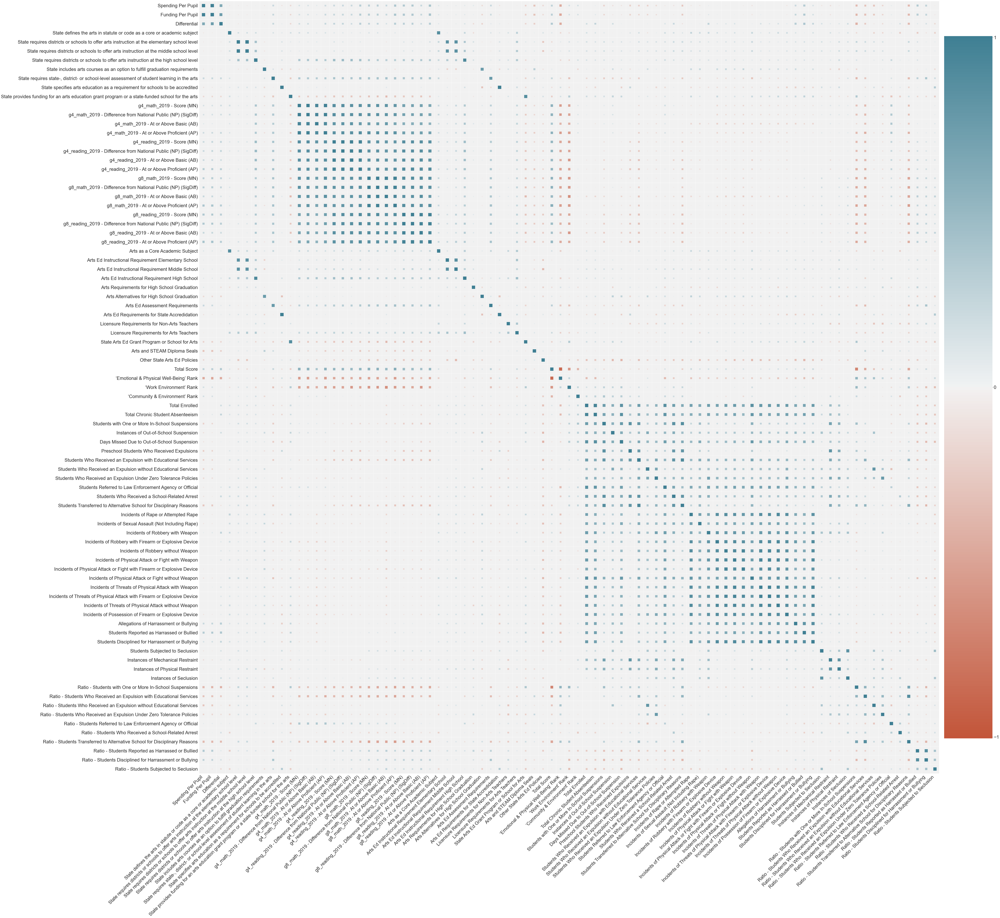

In [41]:
plt.figure(figsize=(100, 100))
corrplot(corr)

In [43]:
plt.figure(figsize=(250, 120))
# sns.set(font_scale = 3)
matrix = np.triu(corr)
sns.heatmap(corr, annot=True, mask=matrix)
plt.tight_layout()
plt.savefig('correlations.png')
plt.show()

In [ ]:
# g= sns.pairplot(df,hue = 'target', diag_kind= 'hist',
#              vars=df.columns[:-1],
#              plot_kws=dict(alpha=0.5), 
#              diag_kws=dict(alpha=0.5))
# plt.show()
# plt.figure(figsize=(80, 80))
pairplot = sns.pairplot(data, vars=data.columns[:-1], height=5)
pairplot.set(xticklabels=[])
pairplot.set(yticklabels=[])
for ax in pairplot.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')

plt.tight_layout()
plt.savefig('pairplot.png')
plt.show()

In [54]:
corr["Ratio - Students Subjected to Seclusion"].sort_values(ascending=False)

# Ratio - Students with One or More In-School Suspensions | State requires state-, district- or school-level assessment of student learning in the arts -0.370710
# Ratio - Students with One or More In-School Suspensions | Arts Ed Assessment Requirements -0.307729
# Ratio - Students with One or More In-School Suspensions | Arts as a Core Academic Subject -0.181853

# Ratio - Students Who Received an Expulsion with Educational Services | Arts Ed Assessment Requirements -0.341254
# Ratio - Students Who Received an Expulsion with Educational Services | State requires state-, district- or school-level assessment of student learning in the arts -0.271867
# Ratio - Students Who Received an Expulsion with Educational Services | Licensure Requirements for Arts Teachers -0.210208
# ...

# Ratio - Students Who Received an Expulsion Under Zero Tolerance Policies | State provides funding for an arts education grant program or a state-funded school for the arts -0.225786
# Ratio - Students Who Received an Expulsion Under Zero Tolerance Policies | Licensure Requirements for Arts Teachers -0.215572
# Ratio - Students Who Received an Expulsion Under Zero Tolerance Policies | State Arts Ed Grant Program or School for Arts -0.209474

# Ratio - Students Referred to Law Enforcement Agency or Official | State provides funding for an arts education grant program or a state-funded school for the arts -0.287566
# Ratio - Students Referred to Law Enforcement Agency or Official | State Arts Ed Grant Program or School for Arts -0.199571

# Ratio - Students Who Received a School-Related Arrest | State provides funding for an arts education grant program or a state-funded school for the arts -0.219756
# Ratio - Students Who Received a School-Related Arrest | Arts as a Core Academic Subject -0.217686
# Ratio - Students Who Received a School-Related Arrest | State defines the arts in statute or code as a core or academic subject -0.209959

# Ratio - Students Transferred to Alternative School for Disciplinary Reasons | State requires state-, district- or school-level assessment of student learning in the arts -0.350464
# Ratio - Students Transferred to Alternative School for Disciplinary Reasons | Arts Ed Assessment Requirements -0.310297
# ...

# Ratio - Students Reported as Harrassed or Bullied | State defines the arts in statute or code as a core or academic subject -0.246956

# Ratio - Students Subjected to Seclusion | State Arts Ed Grant Program or School for Arts -0.252620
# Ratio - Students Subjected to Seclusion | State provides funding for an arts education grant program or a state-funded school for the arts -0.236003
# Ratio - Students Subjected to Seclusion | State defines the arts in statute or code as a core or academic subject -0.200302

Ratio - Students Subjected to Seclusion                                                             1.000000
Students Subjected to Seclusion                                                                     0.469787
Ratio - Students Disciplined for Harrassment or Bullying                                            0.426354
Ratio - Students Reported as Harrassed or Bullied                                                   0.417352
Instances of Seclusion                                                                              0.383129
State specifies arts education as a requirement for schools to be accredited                        0.352841
Arts Ed Requirements for State Accredidation                                                        0.352841
g8_math_2019 - At or Above Basic (AB)                                                               0.266297
g8_reading_2019 - At or Above Basic (AB)                                                            0.264360
‘Emotional & Physic

## Use Arts Edu Policies to Predict Discipline

In [156]:
data_cleaned = data.drop(["Spending Per Pupil", "Funding Per Pupil", "Differential"], axis=1)
data_cleaned = data_cleaned.drop(list(data.filter(regex = 'g4|g8')), axis = 1)
data_cleaned = data_cleaned.drop(data_cleaned.columns[np.arange(29, 60, 1)], axis=1)
data_cleaned = data_cleaned.drop(['Other State Arts Ed Policies'], axis=1)
data_cleaned = data_cleaned.drop(['Total Score', '‘Emotional & Physical Well-Being’ Rank', '‘Work Environment’ Rank', '‘Community & Environment’ Rank',], axis=1)

data_cleaned = data_cleaned.drop(list(data.filter(regex = 'Ratio')), axis = 1)
data_labels = data["Ratio - Students with One or More In-School Suspensions"]
data_cleaned = pd.concat([data_cleaned, data_labels], axis=1)

data_unlabeled = data_cleaned.drop("Ratio - Students with One or More In-School Suspensions", axis=1)
# data_unlabeled.info()

In [157]:
data_scaled = StandardScaler().fit_transform(data_unlabeled)

In [158]:
train, test, target, target_test = train_test_split(data_scaled, data_labels, test_size=0.2)

lin_reg = LinearRegression()
lin_reg.fit(train, target)

# print("Predictions:", lin_reg.predict(test)[:5])
# print("Actual labels:", list(target_test)[:5])

preds = lin_reg.predict(test)
mse = mean_squared_error(target_test, preds)
rmse = np.sqrt(mse)
print("RMSE: ", rmse)

RMSE:  0.03972416309886397


In [166]:
def calculate_vif_(X, thresh=5.0):
    variables = list(range(X.shape[1]))
    dropped = True
    while dropped:
        dropped = False
        vif = [variance_inflation_factor(X.iloc[:, variables].values, ix)
               for ix in range(X.iloc[:, variables].shape[1])]

        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + X.iloc[:, variables].columns[maxloc] +
                  '\' at index: ' + str(maxloc))
            del variables[maxloc]
            dropped = True

    print('Remaining variables:')
    print(X.columns[variables])
    return X.iloc[:, variables]

data_cleaned = calculate_vif_(data_cleaned)
data_unlabeled = data_cleaned.drop("Ratio - Students with One or More In-School Suspensions", axis=1)
data_labels = data["Ratio - Students with One or More In-School Suspensions"]

data_scaled = StandardScaler().fit_transform(data_unlabeled)

train, test, target, target_test = train_test_split(data_scaled, data_labels, test_size=0.2)

lin_reg.fit(train, target)

preds = lin_reg.predict(test)
mse = mean_squared_error(target_test, preds)
rmse = np.sqrt(mse)
print("RMSE: ", rmse)

Remaining variables:
Index(['State defines the arts in statute or code as a core or academic subject',
       'State adopted early childhood or prekindergarten arts education standards',
       'State adopted elementary and/or secondary arts education standards',
       'State requires districts or schools to offer arts instruction at the high school level',
       'State includes arts courses as an option to fulfill graduation requirements',
       'State requires state-, district- or school-level assessment of student learning in the arts',
       'State provides funding for an arts education grant program or a state-funded school for the arts',
       'Early Childhood Arts Ed Standards',
       'Elementary & Secondary Arts Ed Standards',
       'Arts Ed Instructional Requirement Elementary School',
       'Arts Ed Instructional Requirement Middle School',
       'Arts Requirements for High School Graduation',
       'Arts Alternatives for High School Graduation',
       'Arts Ed Ass

/usr/local/anaconda3/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1715: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


State defines the arts in statute or code as a core or academic subject                                0.089397815042536
State adopted early childhood or prekindergarten arts education standards                              0.000000000000000
State adopted elementary and/or secondary arts education standards                                     0.000000000000000
State requires districts or schools to offer arts instruction at the high school level                 0.087045495151576
State includes arts courses as an option to fulfill graduation requirements                            0.001977704726740
State requires state-, district- or school-level assessment of student learning in the arts            0.122386943065990
State provides funding for an arts education grant program or a state-funded school for the arts       0.061006903021880
Early Childhood Arts Ed Standards                                                                      0.000000000000000
Elementary & Secondary Arts Ed S

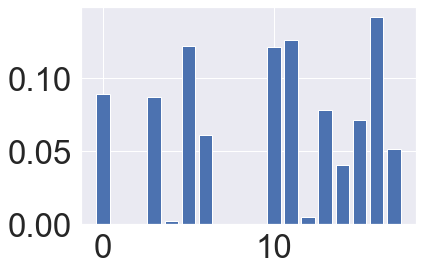

In [163]:
feature_list = list(data_unlabeled.columns)

model = DecisionTreeRegressor()
# fit the model
model.fit(train, target)
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
    print('{:<100s}{:{w}.{p}f}'.format(feature_list[i],v, w=20, p=15))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

State defines the arts in statute or code as a core or academic subject                                0.082490665890246
State adopted early childhood or prekindergarten arts education standards                              0.000000000000000
State adopted elementary and/or secondary arts education standards                                     0.000000000000000
State requires districts or schools to offer arts instruction at the high school level                 0.081061164897446
State includes arts courses as an option to fulfill graduation requirements                            0.053887513879225
State requires state-, district- or school-level assessment of student learning in the arts            0.098632464567906
State provides funding for an arts education grant program or a state-funded school for the arts       0.136608426976168
Early Childhood Arts Ed Standards                                                                      0.000000000000000
Elementary & Secondary Arts Ed S

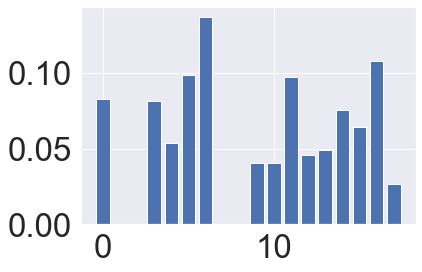

In [164]:
model = RandomForestRegressor()
# fit the model
model.fit(train, target)
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
    print('{:<100s}{:{w}.{p}f}'.format(feature_list[i],v, w=20, p=15))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

State defines the arts in statute or code as a core or academic subject                               -0.004193820164329
State adopted early childhood or prekindergarten arts education standards                             -0.000000000000000
State adopted elementary and/or secondary arts education standards                                     0.000000000000000
State requires districts or schools to offer arts instruction at the high school level                 0.011263302072375
State includes arts courses as an option to fulfill graduation requirements                           -0.010680807239837
State requires state-, district- or school-level assessment of student learning in the arts            0.001399197383814
State provides funding for an arts education grant program or a state-funded school for the arts       0.011586506402422
Early Childhood Arts Ed Standards                                                                     -0.000000000000000
Elementary & Secondary Arts Ed S

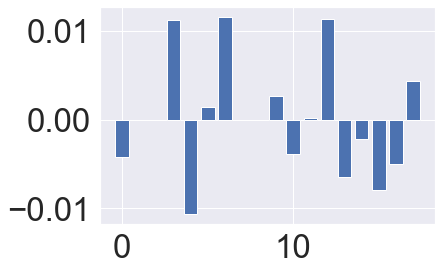

<class 'statsmodels.iolib.summary.Summary'>
"""
                                               OLS Regression Results                                              
===================================================================================================================
Dep. Variable:     Ratio - Students with One or More In-School Suspensions   R-squared:                       0.493
Model:                                                                 OLS   Adj. R-squared:                  0.210
Method:                                                      Least Squares   F-statistic:                     1.740
Date:                                                     Thu, 13 May 2021   Prob (F-statistic):              0.110
Time:                                                             18:15:41   Log-Likelihood:                 101.21
No. Observations:                                                       40   AIC:                            -172.4
Df Residuals:                                                           25   BIC:                            -147.1
Df Model:                                                               14                                         
Covariance Type:                                                 nonrobust                                         
====================================================================================================================================================================
                                                                                                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                0.0484      0.004     11.778      0.000       0.040       0.057
State defines the arts in statute or code as a core or academic subject                             -0.0042      0.005     -0.928      0.362      -0.013       0.005
State adopted early childhood or prekindergarten arts education standards                        -2.079e-18   2.14e-18     -0.973      0.340   -6.48e-18    2.32e-18
State adopted elementary and/or secondary arts education standards                               -8.951e-19   2.12e-18     -0.423      0.676   -5.26e-18    3.47e-18
State requires districts or schools to offer arts instruction at the high school level               0.0113      0.005      2.343      0.027       0.001       0.021
State includes arts courses as an option to fulfill graduation requirements                         -0.0107      0.009     -1.242      0.226      -0.028       0.007
State requires state-, district- or school-level assessment of student learning in the arts          0.0014      0.007      0.209      0.836      -0.012       0.015
State provides funding for an arts education grant program or a state-funded school for the arts     0.0116      0.004      2.708      0.012       0.003       0.020
Early Childhood Arts Ed Standards                                                                -1.122e-18   2.34e-18     -0.480      0.635   -5.93e-18    3.69e-18
Elementary & Secondary Arts Ed Standards                                                         -2.581e-18   4.11e-18     -0.628      0.535    -1.1e-17    5.88e-18
Arts Ed Instructional Requirement Elementary School                                                  0.0026      0.008      0.344      0.734      -0.013       0.018
Arts Ed Instructional Requirement Middle School                                                     -0.0038      0.007     -0.524      0.605      -0.019       0.011
Arts Requirements for High School Graduation                                                         0.0002      0.004      0.036      0.972      -0.009       0.009
Arts Alternatives for High School Gr

In [167]:
importance = lin_reg.coef_
feature_list = list(data_unlabeled.columns)

for i, v in enumerate(importance):
    print('{:<100s}{:{w}.{p}f}'.format(feature_list[i],v, w=20, p=15))
    
plt.bar([x for x in range(len(importance))], importance)
plt.show()

x_temp = sm.add_constant(train, has_constant="add")
es = sm.OLS(target, x_temp)
es2 = es.fit()
feature_list.insert(0, 'const')
es2.summary(xname=feature_list)

In [170]:
ntrees = 100 # number of trees
maxdepth = 5 # max depth for a single tree
npredictors = 2 # number of predictors

# if max_features is int, then consider max_features features at each split.
rf = RandomForestRegressor(
        n_estimators=ntrees,
        max_depth=maxdepth,
        max_features=npredictors,
        n_jobs=-1,
        oob_score=True)

rf.fit(train, target)

predictions = rf.predict(test)
r2 = r2_score(target_test, predictions)

print("Score", rf.score(test, target_test))
print("OOB Score", rf.oob_score_)
print("R2 Score", r2)
# Score of rf is the R2 score?

Score -0.2639820131531232
OOB Score -0.003179294550357481
R2 Score -0.2639820131531232


## Use Arts Edu Policies to Predict Scores

In [ ]:
data.info()

In [70]:
data_cleaned = data.drop(["Spending Per Pupil", "Funding Per Pupil", "Differential"], axis=1)
data_cleaned = data_cleaned.drop(list(data.filter(regex = 'g4|g8')), axis = 1)
data_cleaned = data_cleaned.drop(data_cleaned.columns[[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]], axis=1)
# df.drop(df.columns[[0, 4, 2]], axis = 1

data_labels = data["g8_reading_2019 - Score (MN)"]
data_cleaned = pd.concat([data_cleaned, data_labels], axis=1)

data_unlabeled = data_cleaned.drop("g8_reading_2019 - Score (MN)", axis=1)
data_unlabeled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50 entries, Alabama to Wyoming
Data columns (total 14 columns):
 #   Column                                                                                            Non-Null Count  Dtype  
---  ------                                                                                            --------------  -----  
 0   State defines the arts in statute or code as a core or academic subject                           50 non-null     int64  
 1   State adopted early childhood or prekindergarten arts education standards                         50 non-null     int64  
 2   State adopted elementary and/or secondary arts education standards                                50 non-null     int64  
 3   State requires districts or schools to offer arts instruction at the elementary school level      50 non-null     int64  
 4   State requires districts or schools to offer arts instruction at the middle school level          50 non-null     int64  
 5

In [71]:
from sklearn.preprocessing import StandardScaler

data_scaled = StandardScaler().fit_transform(data_unlabeled)

In [75]:
from sklearn.model_selection import train_test_split
# data_target = data_cleaned["g8_reading_2019 - Score (MN)"]
data_target = data_labels
train, test, target, target_test = train_test_split(data_scaled, data_target, test_size=0.2)

from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(train, target)

# let's try the full preprocessing pipeline on a few training instances
# data_test = test
# labels = target_test

# print("Predictions:", lin_reg.predict(data_test)[:5])
# print("Actual labels:", list(labels)[:5])

from sklearn.metrics import mean_squared_error

preds = lin_reg.predict(test)
mse = mean_squared_error(target_test, preds)
rmse = np.sqrt(mse)
print("RMSE: ", rmse)

RMSE:  2.6192888399392134


Feature: State defines the arts in statute or code as a core or academic subject Importance: -0.2844144877897056
Feature: State adopted early childhood or prekindergarten arts education standards Importance: -1.1102230246251565e-16
Feature: State adopted elementary and/or secondary arts education standards Importance: 4.996003610813204e-16
Feature: State requires districts or schools to offer arts instruction at the elementary school level Importance: 0.15805215150210353
Feature: State requires districts or schools to offer arts instruction at the middle school level Importance: 0.15805215150210694
Feature: State requires districts or schools to offer arts instruction at the high school level Importance: 1.4811906847122807
Feature: State includes arts courses as an option to fulfill graduation requirements Importance: -0.3882135867272851
Feature: State requires state-, district- or school-level assessment of student learning in the arts Importance: 1.0186900274527912
Feature: State spe

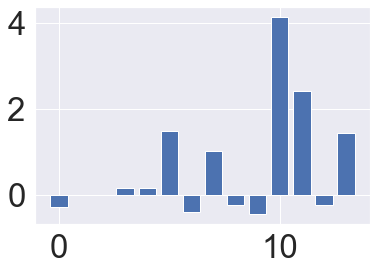

(40, 14)
(40,)
14
(40, 15)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                 
========================================================================================
Dep. Variable:     g8_reading_2019 - Score (MN)   R-squared:                       0.488
Model:                                      OLS   Adj. R-squared:                  0.287
Method:                           Least Squares   F-statistic:                     2.425
Date:                          Wed, 12 May 2021   Prob (F-statistic):             0.0287
Time:                                  19:40:51   Log-Likelihood:                -105.47
No. Observations:                            40   AIC:                             234.9
Df Residuals:                                28   BIC:                             255.2
Df Model:                                    11                                         
Covariance Type:                      nonrobust                                         
====================================================================================================================================================================
                                                                                                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                              262.4357      0.699    375.409      0.000     261.004     263.868
State defines the arts in statute or code as a core or academic subject                             -0.2844      0.844     -0.337      0.739      -2.013       1.444
State adopted early childhood or prekindergarten arts education standards                         1.449e-14   1.04e-15     13.977      0.000    1.24e-14    1.66e-14
State adopted elementary and/or secondary arts education standards                                5.616e-15   2.55e-15      2.204      0.036    3.97e-16    1.08e-14
State requires districts or schools to offer arts instruction at the elementary school level         0.1581      0.351      0.450      0.656      -0.562       0.878
State requires districts or schools to offer arts instruction at the middle school level             0.1581      0.351      0.450      0.656      -0.562       0.878
State requires districts or schools to offer arts instruction at the high school level               1.4812      0.827      1.791      0.084      -0.213       3.175
State includes arts courses as an option to fulfill graduation requirements                         -0.3882      0.689     -0.564      0.577      -1.799       1.022
State requires state-, district- or school-level assessment of student learning in the arts          1.0187      0.776      1.313      0.200      -0.571       2.608
State specifies arts education as a requirement for schools to be accredited                        -0.2323      0.726     -0.320      0.752      -1.720       1.256
State provides funding for an arts education grant program or a state-funded school for the arts    -0.4506      0.866     -0.520      0.607      -2.224       1.323
Total Score                                                                                          4.1425      3.802      1.090      0.285      -3.645      11.930
‘Emotional & Physical Well-Being’ Rank                                                               2.4071      3.032      0.794      0.434      -3.803       8.617
‘Work Environment’ Rank                                                                             -0.2282      1.318     -0.173      0.864      -2.928       2.472
‘Community & Environment’ Rank                                                                       1.4500      1.234      1.175      0.250      -1.078       3.978
===

In [76]:
importance = lin_reg.coef_
feature_list = list(data_unlabeled.columns)

for i, v in enumerate(importance):
    print('Feature: {0:30} Importance: {1}'.format(feature_list[i], v))
    
plt.bar([x for x in range(len(importance))], importance)
plt.show()

import statsmodels.api as sm

# print(len(feature_list))
print(train.shape)
print(target.shape)

# feature_list = feature_list + ["1", "2", "3", "4", "5"]
print(len(feature_list))

x_temp = sm.add_constant(train, has_constant="add")
print(x_temp.shape)
es = sm.OLS(target, x_temp)
es2 = es.fit()
feature_list.insert(0, 'const')
es2.summary(xname=feature_list)

In [50]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

temp = sm.add_constant(data_unlabeled)
vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(temp.values, i) for i in range(temp.values.shape[1])]
vif["features"] = temp.columns
print(vif.round(1))

    VIF Factor                                           features
0          1.3  State defines the arts in statute or code as a...
1          0.0  State adopted early childhood or prekindergart...
2          0.0  State adopted elementary and/or secondary arts...
3          inf  State requires districts or schools to offer a...
4          inf  State requires districts or schools to offer a...
5          1.8  State requires districts or schools to offer a...
6          1.1  State includes arts courses as an option to fu...
7          1.3  State requires state-, district- or school-lev...
8          1.2  State specifies arts education as a requiremen...
9          1.3  State provides funding for an arts education g...
10        29.1                                        Total Score
11        19.5             ‘Emotional & Physical Well-Being’ Rank
12         4.5                            ‘Work Environment’ Rank
13         3.4                     ‘Community & Environment’ Rank


/usr/local/anaconda3/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1715: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
/usr/local/anaconda3/lib/python3.7/site-packages/statsmodels/stats/outliers_influence.py:193: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


In [53]:
def calculate_vif_(X, thresh=5.0):
    variables = list(range(X.shape[1]))
    dropped = True
    while dropped:
        dropped = False
        vif = [variance_inflation_factor(X.iloc[:, variables].values, ix)
               for ix in range(X.iloc[:, variables].shape[1])]

        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + X.iloc[:, variables].columns[maxloc] +
                  '\' at index: ' + str(maxloc))
            del variables[maxloc]
            dropped = True

    print('Remaining variables:')
    print(X.columns[variables])
    return X.iloc[:, variables]

noncollinear_data = calculate_vif_(data_cleaned)

noncollinear_data_unlabeled = noncollinear_data.drop("g8_reading_2019 - Score (MN)", axis=1)
noncollinear_labels  = noncollinear_data["g8_reading_2019 - Score (MN)"]

noncollinear_data_scaled = StandardScaler().fit_transform(noncollinear_data_unlabeled)

train_nc, test_nc, target_nc, target_test_nc = train_test_split(noncollinear_data_scaled, noncollinear_labels, test_size=0.2)

lin_reg.fit(train_nc, target_nc)

preds = lin_reg.predict(test_nc)
mse = mean_squared_error(target_test_nc, preds)
rmse = np.sqrt(mse)
print("RMSE: ", rmse)

dropping 'State requires districts or schools to offer arts instruction at the elementary school level' at index: 3
dropping 'Total Score' at index: 9
Remaining variables:
Index(['State defines the arts in statute or code as a core or academic subject',
       'State adopted early childhood or prekindergarten arts education standards',
       'State adopted elementary and/or secondary arts education standards',
       'State requires districts or schools to offer arts instruction at the middle school level',
       'State requires districts or schools to offer arts instruction at the high school level',
       'State includes arts courses as an option to fulfill graduation requirements',
       'State requires state-, district- or school-level assessment of student learning in the arts',
       'State specifies arts education as a requirement for schools to be accredited',
       'State provides funding for an arts education grant program or a state-funded school for the arts',
       

/usr/local/anaconda3/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1715: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
/usr/local/anaconda3/lib/python3.7/site-packages/statsmodels/stats/outliers_influence.py:193: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


In [78]:
from sklearn.ensemble import AdaBoostClassifier, BaggingRegressor, RandomForestRegressor
from sklearn.metrics import r2_score

ntrees = 100 # number of trees
maxdepth = 5 # max depth for a single tree
npredictors = 2 # number of predictors

# if max_features is int, then consider max_features features at each split.
rf = RandomForestRegressor(
        n_estimators=ntrees,
        max_depth=maxdepth,
        max_features=npredictors,
        random_state=10,
        n_jobs=-1,
        oob_score=True)

rf.fit(train, target)

predictions = rf.predict(test)
r2 = r2_score(target_test, predictions)

print("Score", rf.score(test, target_test))
print("OOB Score", rf.oob_score_)
print("R2 Score", r2)
# Score of rf is the R2 score?

Score 0.085277168030508
OOB Score 0.11070097362897968
R2 Score 0.085277168030508


In [83]:
from itertools import product
from collections import OrderedDict

param_dict = OrderedDict(
    n_trees = [100, 200, 300, 400, 500, 600, 700, 800, 1000],
    n_predictors = [0.2, 0.4, 0.6, 0.8, 1.0],
    max_depth = [1, 2, 5, 10]
)

results = {}
estimators = {}
for ntrees, npreds, maxdepth in product(*param_dict.values()):
    params = (ntrees, npreds, maxdepth)
    
    est = RandomForestRegressor(
            n_estimators=ntrees,
            max_depth=maxdepth,
            max_features=npreds,
            n_jobs=-1,
            random_state=10,
            oob_score=True)
    
    est.fit(train, target)
    results[params] = est.oob_score_
    estimators[params] = est

outparams = max(results, key = results.get)
# outparams

rf1 = estimators[outparams]
print("Score", rf1.score(test, target_test))

predictions = rf1.predict(test)
r2 = r2_score(target_test, predictions)
print("R2", r2)

Score 0.11938324034892489
R2 0.11938324034895187


## Use Arts Edu Policies to Predict Happiness

In [67]:
data_cleaned = data.drop(["Spending Per Pupil", "Funding Per Pupil", "Differential", "‘Emotional & Physical Well-Being’ Rank", "‘Work Environment’ Rank", "‘Community & Environment’ Rank"], axis=1)
data_cleaned = data_cleaned.drop(list(data.filter(regex = 'g4|g8')), axis = 1)

data_labels = data["Total Score"]
data_cleaned = pd.concat([data_cleaned, data_labels], axis=1)

# data_cleaned.info()

data_unlabeled = data_cleaned.drop("Total Score", axis=1)
data_unlabeled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 51 entries, Alabama to District of Columbia
Data columns (total 66 columns):
 #   Column                                                                                            Non-Null Count  Dtype  
---  ------                                                                                            --------------  -----  
 0   State defines the arts in statute or code as a core or academic subject                           50 non-null     float64
 1   State adopted early childhood or prekindergarten arts education standards                         50 non-null     float64
 2   State adopted elementary and/or secondary arts education standards                                50 non-null     float64
 3   State requires districts or schools to offer arts instruction at the elementary school level      50 non-null     float64
 4   State requires districts or schools to offer arts instruction at the middle school level          50 non-null  

In [58]:
data_scaled = StandardScaler().fit_transform(data_unlabeled)

In [68]:
train, test, target, target_test = train_test_split(data_scaled, data_labels, test_size=0.2)

lin_reg.fit(train, target)

preds = lin_reg.predict(test)
mse = mean_squared_error(target_test, preds)
rmse = np.sqrt(mse)
print("RMSE: ", rmse)

RMSE:  12.348394906960833


Feature: State defines the arts in statute or code as a core or academic subject Importance: -1.1277943521083402
Feature: State adopted early childhood or prekindergarten arts education standards Importance: 0.0
Feature: State adopted elementary and/or secondary arts education standards Importance: 1.1102230246251565e-15
Feature: State requires districts or schools to offer arts instruction at the elementary school level Importance: -2.707238812717118
Feature: State requires districts or schools to offer arts instruction at the middle school level Importance: -2.7072388127171236
Feature: State requires districts or schools to offer arts instruction at the high school level Importance: -3.695365791031811
Feature: State includes arts courses as an option to fulfill graduation requirements Importance: -2.9119933528793958
Feature: State requires state-, district- or school-level assessment of student learning in the arts Importance: 4.451179696726774
Feature: State specifies arts education

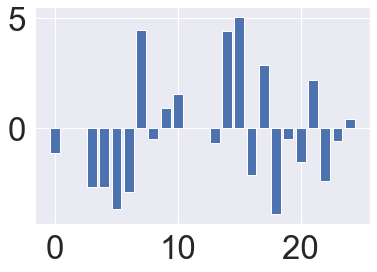

(40, 26)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Total Score   R-squared:                       0.454
Model:                            OLS   Adj. R-squared:                 -0.064
Method:                 Least Squares   F-statistic:                    0.8763
Date:                Wed, 12 May 2021   Prob (F-statistic):              0.612
Time:                        19:36:41   Log-Likelihood:                -129.90
No. Observations:                  40   AIC:                             299.8
Df Residuals:                      20   BIC:                             333.6
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
====================================================================================================================================================================
                                                                                                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                               52.6790      1.558     33.803      0.000      49.428      55.930
State defines the arts in statute or code as a core or academic subject                             -1.1278      3.847     -0.293      0.772      -9.153       6.897
State adopted early childhood or prekindergarten arts education standards                         9.559e-15   2.69e-15      3.554      0.002    3.95e-15    1.52e-14
State adopted elementary and/or secondary arts education standards                                1.328e-15   2.63e-15      0.504      0.620   -4.16e-15    6.82e-15
State requires districts or schools to offer arts instruction at the elementary school level        -2.7072      2.520     -1.074      0.296      -7.965       2.550
State requires districts or schools to offer arts instruction at the middle school level            -2.7072      2.520     -1.074      0.296      -7.965       2.550
State requires districts or schools to offer arts instruction at the high school level              -3.6954      5.240     -0.705      0.489     -14.625       7.235
State includes arts courses as an option to fulfill graduation requirements                         -2.9120      5.071     -0.574      0.572     -13.490       7.666
State requires state-, district- or school-level assessment of student learning in the arts          4.4512      4.745      0.938      0.359      -5.447      14.349
State specifies arts education as a requirement for schools to be accredited                        -0.5230      1.191     -0.439      0.665      -3.007       1.961
State provides funding for an arts education grant program or a state-funded school for the arts     0.9082      4.772      0.190      0.851      -9.046      10.862
Arts as a Core Academic Subject                                                                      1.5679      3.737      0.420      0.679      -6.228       9.363
Early Childhood Arts Ed Standards                                                                -5.091e-15   4.77e-15     -1.066      0.299   -1.51e-14    4.87e-15
Elementary & Secondary Arts Ed Standards                                                           -4.7e-15   2.17e-15     -2.164      0.043   -9.23e-15   -1.71e-16
Arts Ed Instructional Requirement Elementary School                                                 -0.6726      4.005     -0.168      0.868      -9.026       7.681
Arts Ed Instructional Requirement Middle School                                                      4.4300      

In [69]:
importance = lin_reg.coef_
feature_list = list(data_unlabeled.columns)

for i, v in enumerate(importance):
    print('Feature: {0:30} Importance: {1}'.format(feature_list[i], v))
    
plt.bar([x for x in range(len(importance))], importance)
plt.show()

x_temp = sm.add_constant(train, has_constant="add")
print(x_temp.shape)
es = sm.OLS(target, x_temp)
es2 = es.fit()
feature_list.insert(0, 'const')
es2.summary(xname=feature_list)

## Convert to Correlation Matrix JSON

In [ ]:
# only features used in the site. Each column is a selectable layer
data_selected = data[[
    'State defines the arts in statute or code as a core or academic subject',
    'State adopted early childhood or prekindergarten arts education standards',
    'State adopted elementary and/or secondary arts education standards',
    'State requires districts or schools to offer arts instruction at the elementary school level',
    'State requires districts or schools to offer arts instruction at the middle school level',
    'State requires districts or schools to offer arts instruction at the high school level',
    'State includes arts courses as an option to fulfill graduation requirements',
    'State requires state-, district- or school-level assessment of student learning in the arts',
    'State specifies arts education as a requirement for schools to be accredited',
    'State provides funding for an arts education grant program or a state-funded school for the arts',
    'g4_math_2019 - Score (MN)',
    'g8_math_2019 - Score (MN)',
    'g4_reading_2019 - Score (MN)',
    'g8_reading_2019 - Score (MN)']].copy()

In [ ]:
np.set_printoptions(threshold=10000000)
# np.corrcoef(data_selected)

In [ ]:
corr_selected = data_selected.corr()
# corr_selected.to_csv("../data/correlation_matrix.csv")
corr_selected_np = corr_selected.to_numpy()

with open('../data/correlation-matrix.json', 'w', encoding='utf-8') as f:
    f.write(simplejson.dumps(corr_selected_np.tolist(), ignore_nan=True, ensure_ascii=False))

In [ ]:
# plt.scatter(df.iloc[:,0], df.iloc[:,1])
# plt.show()

In [ ]:
# plt.scatter(df.iloc[:,1], df['art_edu_policy_col_6'])
# plt.show()

In [ ]:
# df.corr(method='kendall')

In [ ]:
# scipy.stats.pearsonr(df['scores_grade4_math'], df['art_edu_policy_col_6'])

In [ ]:
# scipy.stats.spearmanr(df['scores_grade4_math'], df['art_edu_policy_col_6'])

In [ ]:
# scipy.stats.kendalltau(df['scores_grade4_math'], df['art_edu_policy_col_6'])